# Steps to build CNN to solve Emergency vs Non-Emergency vehicle classification problem

1. Loading the Dataset
2. Pre-processing the Data
3. Creating Training and Validation set
4. Defining the Model Architecture
5. Compiling the Model
6. Training the Model
7. Evaluating model performance

## 1. Loading the Dataset

In [1]:
# import necessary libraries and functions
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

# importing layers from keras
from keras.layers import Dense, InputLayer, BatchNormalization, Dropout
from keras.models import Sequential
# importing adam optimizer from keras optimizer module 
from keras.optimizers import Adam

# train_test_split to create training and validation set
from sklearn.model_selection import train_test_split
# accuracy_score to calculate the accuracy of predictions
from sklearn.metrics import accuracy_score

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# unzipping the Dataset.zip file
!unzip /content/drive/My\ Drive/Dataset.zip

In [2]:
# create random number generator
seed = 42

In [5]:
# reading the csv file
data = pd.read_csv('Dataset/Dataset/emergency_classification.csv')

In [7]:
# load images and store it in numpy array

# empty list to store the images
X = []
# iterating over each image
for img_name in data.image_names:
    # loading the image using its name
    img = plt.imread('Dataset/Dataset/images/' + img_name)
    # saving each image in the list
    X.append(img)
    
# converting the list of images into array
X=np.array(X)

# storing the target variable in separate variable
y = data.emergency_or_not.values

In [8]:
# shape of the images
X.shape

(2352, 224, 224, 3)

## 2. Pre-processing the Data

In [7]:
# since we are using CNN, we do not have to resize the images into 1D array. 

In [9]:
# normalizing the pixel values
X = X / X.max()

## 3. Creating Training and Validation set

In [10]:
# creating a training and validation set
X_train, X_valid, y_train, y_valid=train_test_split(X,y,test_size=0.3, random_state=seed)

In [11]:
# shape of training and validation set
(X_train.shape, y_train.shape), (X_valid.shape, y_valid.shape)

(((1646, 224, 224, 3), (1646,)), ((706, 224, 224, 3), (706,)))

## 4. Defining the Model Architecture

![alt text](https://drive.google.com/uc?id=1qsops2ZfESuzjg7-V0rmOfVE0PtErYrJ)

In [12]:
# importing the convolutional and flatten layer from keras
from keras.layers import Conv2D, Flatten

In [13]:
# defining the model architecture

# creating a sequential model 
model = Sequential()
    
# defining input layer with 3D input of shape (224,224,3)
model.add(InputLayer(input_shape=(224, 224, 3)))

# defining the first convolutional layer with 25 filters of size (5,5)
model.add(Conv2D(25, (5, 5), activation='relu', strides=(1, 1), padding='valid'))
# defining the second convolutional layer with 50 filters of size (5,5)
model.add(Conv2D(50, (5, 5), activation='relu', strides=(1, 1), padding='valid'))

# flattening the output from convolutional layers so that it can be forwarded to the dense layers
model.add(Flatten())

# defining the first dense or fully connected layer with 100 neurons
model.add(Dense(units=100, activation='sigmoid'))
# defining the output layer with 1 neuron since it is a binary classification problem
model.add(Dense(units=1, activation='sigmoid'))

In [14]:
# printing summary of the model
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 220, 220, 25)      1900      
                                                                 
 conv2d_1 (Conv2D)           (None, 216, 216, 50)      31300     
                                                                 
 flatten (Flatten)           (None, 2332800)           0         
                                                                 
 dense (Dense)               (None, 100)               233280100 
                                                                 
 dense_1 (Dense)             (None, 1)                 101       
                                                                 
Total params: 233313401 (890.02 MB)
Trainable params: 233313401 (890.02 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


## Understanding the Architecture
*  Input shape is (224,224,3) since images are of this shape
*  We then applied 25 filters each of shape (5,5) and stride is (1,1)
*  So the output from first convolutional layer is: **(224-5+1,224-5+1,25)** which is **(220,220,25)**
*  We then applied 50 filters of shape (5,5) each with stride (1,1)
*  Then the output is **(220-5+1,220-5+1,50)** which is **(216,216,50)**
*  Then this output is flattened which resulted in 216 X 216 X 50 = 2332800 features
*  Finally these features are passed through the fully connected layers.


## Understanding the number of parameters of different layers

1.   First Convolutional Layer
    * Number of input channels = 3
    * Number of filters = 25
    * Filter Size = (5,5)
    * Learnable parameters = **25 * 5 * 5 * 3 + 25** (1 bias for each filter) = **1900**
2.   Second Convolutional Layer
    * Number of input channels = 25
    * Number of filters = 50
    * Filter Size = (5,5)
    * Learnable parameters = **50 * 5 * 5 * 25 + 50** (1 bias for each filter) = **31300**
3.   First Fully Connected Layer
    * Number of input features = 216 * 216 * 50 = 2332800
    * Number of neurons in this hidden layer = 100
    * Learnable parameters = **2332800 * 100 + 100** (1 bias for each neuron) = **233280100**
3.   Output Layer
    * Number of input features = 100
    * Number of neurons in this layer = 1
    * Learnable parameters = **100 * 1 + 1** (1 bias for each neuron) = **101**



## 5. Compiling the Model

In [19]:
# compiling the model
model.compile(loss='binary_crossentropy', optimizer="sgd", metrics=['accuracy'])
#model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])


## 6. Training the Model

In [20]:
# training the model
model_history = model.fit(X_train, y_train, epochs=1, batch_size=128,validation_data=(X_valid,y_valid))

C:\Anaconda\Lib\site-packages\tensorflow\python\util\dispatch.py:1260: SyntaxWarning: In loss categorical_crossentropy, expected y_pred.shape to be (batch_size, num_classes) with num_classes > 1. Received: y_pred.shape=(None, 1). Consider using 'binary_crossentropy' if you only have 2 classes.
  return dispatch_target(*args, **kwargs)


13/13 [==============================] - 107s 8s/step - loss: 0.0000e+00 - accuracy: 0.5875 - val_loss: 0.0000e+00 - val_accuracy: 0.5609


## 7. Evaluating model performance

In [45]:
# accuracy on training set
print('Accuracy on training set:', accuracy_score(y_train, np.where(model.predict(X_train)[:,0]) < 0.5, 0,1))

52/52 [==============================] - 14s 270ms/step


TypeError: '<' not supported between instances of 'tuple' and 'list'

In [47]:
# First get the predicted probabilities for the positive class
predicted_probabilities = model.predict(X_train)[:, 0]

# Then convert probabilities to binary predictions using np.where
predicted_labels = np.where(predicted_probabilities < 0.5, 0, 1)

# Now, you can use accuracy_score
accuracy = accuracy_score(y_train, predicted_labels)
print('Accuracy on training set:', accuracy)


52/52 [==============================] - 14s 268ms/step
Accuracy on training set: 0.586269744835966


In [34]:
# accuracy on validation set
print('Accuracy on validation set:', accuracy_score(y_valid, np.where(model.predict(X_valid)[:,0]) < 0.5, 0,1))

23/23 [==============================] - 2s 67ms/step


TypeError: '<' not supported between instances of 'tuple' and 'float'

In [48]:
# First get the predicted probabilities for the positive class
predicted_probabilities = model.predict(X_valid)[:, 0]

# Then convert probabilities to binary predictions using np.where
predicted_labels = np.where(predicted_probabilities < 0.5, 0, 1)

# Now, you can use accuracy_score
accuracy = accuracy_score(y_valid, predicted_labels)
print('Accuracy on training set:', accuracy)


23/23 [==============================] - 6s 271ms/step
Accuracy on training set: 0.5609065155807366


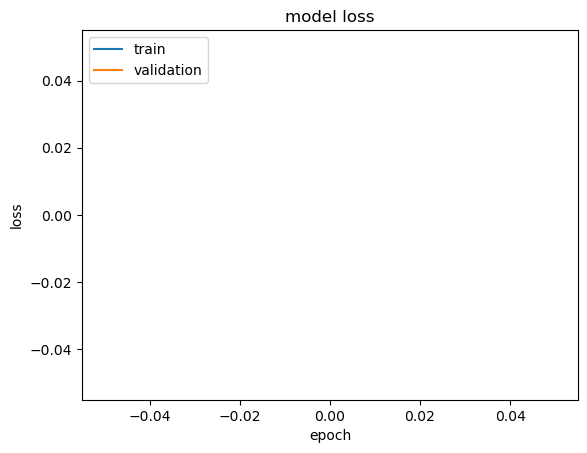

In [49]:
# summarize history for loss
plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

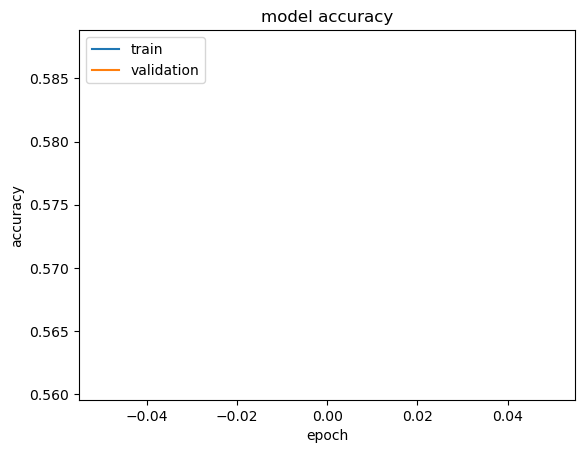

In [50]:
# summarize history for accuracy
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

## Adding Maxpool layer to reduce parameters

In [51]:
# importing maxpool layer from keras
from keras.layers import MaxPool2D

In [52]:
# defining the model architecture with maxpool layer
model = Sequential()
    
model.add(InputLayer(input_shape=(224, 224, 3)))

model.add(Conv2D(25, (5, 5), activation='relu', strides=(1, 1), padding='valid'))
model.add(Conv2D(50, (5, 5), activation='relu', strides=(1, 1), padding='valid'))
# adding maxpool layer after the convolutional layers
model.add(MaxPool2D(pool_size=(4, 4), padding='valid'))
model.add(Flatten())

model.add(Dense(units=100, activation='sigmoid'))
model.add(Dense(units=1, activation='sigmoid'))

# compiling the model
model.compile(loss='binary_crossentropy', optimizer="sgd", metrics=['accuracy'])

In [53]:
# summary of the model
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 220, 220, 25)      1900      
                                                                 
 conv2d_6 (Conv2D)           (None, 216, 216, 50)      31300     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 54, 54, 50)        0         
 g2D)                                                            
                                                                 
 flatten_2 (Flatten)         (None, 145800)            0         
                                                                 
 dense_4 (Dense)             (None, 100)               14580100  
                                                                 
 dense_5 (Dense)             (None, 1)                 101       
                                                      

In [54]:
# training the model
model_history = model.fit(X_train, y_train, epochs=1, batch_size=128,validation_data=(X_valid,y_valid))

13/13 [==============================] - 84s 6s/step - loss: 0.6869 - accuracy: 0.5480 - val_loss: 0.6770 - val_accuracy: 0.5623


In [56]:
# accuracy on training set
print('Accuracy on training set:', accuracy_score(y_train, np.where(model.predict(X_train)[:,0]) < 0.5, 0,1))

52/52 [==============================] - 15s 292ms/step


TypeError: '<' not supported between instances of 'tuple' and 'float'

In [55]:
# First get the predicted probabilities for the positive class
predicted_probabilities = model.predict(X_train)[:, 0]

# Then convert probabilities to binary predictions using np.where
predicted_labels = np.where(predicted_probabilities < 0.5, 0, 1)

# Now, you can use accuracy_score
accuracy = accuracy_score(y_train, predicted_labels)
print('Accuracy on training set:', accuracy)


52/52 [==============================] - 15s 283ms/step
Accuracy on training set: 0.5850546780072904


In [21]:
# accuracy on validation set
print('Accuracy on validation set:', accuracy_score(y_valid, np.where(model.predict(X_valid)[:,0]) < 0.5, 0,1))

Accuracy on validation set: 0.623229461756374 %


In [57]:
# First get the predicted probabilities for the positive class
predicted_probabilities = model.predict(X_valid)[:, 0]

# Then convert probabilities to binary predictions using np.where
predicted_labels = np.where(predicted_probabilities < 0.5, 0, 1)

# Now, you can use accuracy_score
accuracy = accuracy_score(y_valid, predicted_labels)
print('Accuracy on training set:', accuracy)


23/23 [==============================] - 7s 282ms/step
Accuracy on training set: 0.5623229461756374


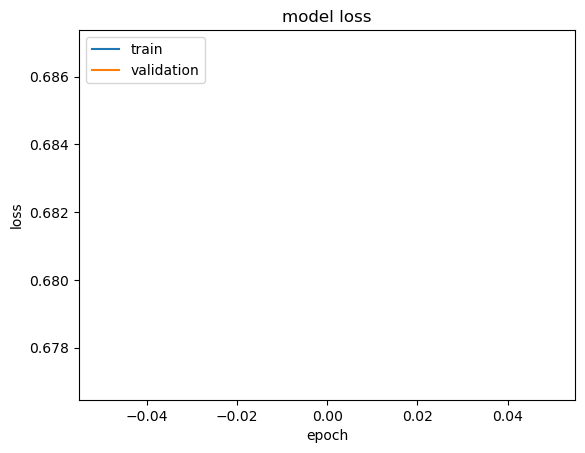

In [58]:
# summarize history for loss
plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

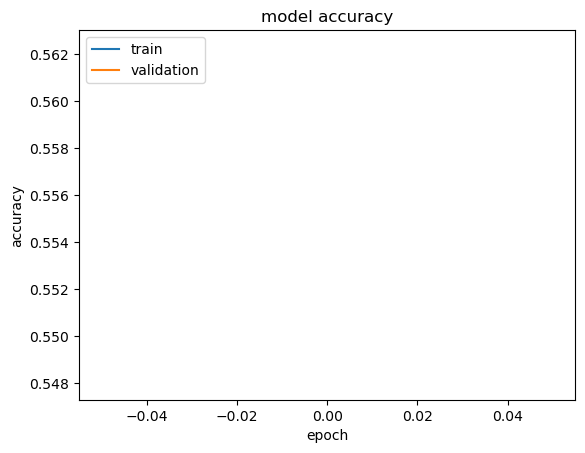

In [59]:
# summarize history for accuracy
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

## Hyperparameter Tuning of Convolutional Neural Networks

1. increase number of convolutional layers
2. increase number of pooling layers
3. increase number of convolutional filters
4. change size of convolutional filters
5. change pooling type 
6. change padding technique
7. change stride

#### Hyperparameters of fully connected layers

1. change activation function of hidden layer
2. increase hidden neurons
3. increase hidden layers
4. increase number of epochs
5. change optimizer
6. add batch normalization layer
7. add dropout layer

## 1. Increasing number of convolutional layers

In [60]:
# increase number of convolutional layers

model = Sequential()
    
model.add(InputLayer(input_shape=(224, 224, 3)))

model.add(Conv2D(25, (5, 5), activation='relu', strides=(1, 1), padding='valid'))
model.add(Conv2D(50, (5, 5), activation='relu', strides=(1, 1), padding='valid'))
model.add(Conv2D(50, (5, 5), activation='relu', strides=(1, 1), padding='valid'))
model.add(MaxPool2D(pool_size=(4, 4), padding='valid'))

model.add(Flatten())

model.add(Dense(units=100, activation='sigmoid'))
model.add(Dense(units=1, activation='sigmoid'))

model.compile(loss='binary_crossentropy', optimizer="sgd", metrics=['accuracy'])

In [61]:
model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 220, 220, 25)      1900      
                                                                 
 conv2d_8 (Conv2D)           (None, 216, 216, 50)      31300     
                                                                 
 conv2d_9 (Conv2D)           (None, 212, 212, 50)      62550     
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 53, 53, 50)        0         
 g2D)                                                            
                                                                 
 flatten_3 (Flatten)         (None, 140450)            0         
                                                                 
 dense_6 (Dense)             (None, 100)               14045100  
                                                      

In [62]:
# training the model
model_history = model.fit(X_train, y_train, epochs=10, batch_size=128,validation_data=(X_valid,y_valid))

Epoch 1/10
13/13 [==============================] - 221s 17s/step - loss: 0.6779 - accuracy: 0.5863 - val_loss: 0.6812 - val_accuracy: 0.5609
Epoch 2/10
13/13 [==============================] - 220s 17s/step - loss: 0.6731 - accuracy: 0.5863 - val_loss: 0.6756 - val_accuracy: 0.5609
Epoch 3/10
13/13 [==============================] - 222s 17s/step - loss: 0.6671 - accuracy: 0.5863 - val_loss: 0.6682 - val_accuracy: 0.5609
Epoch 4/10
13/13 [==============================] - 223s 17s/step - loss: 0.6597 - accuracy: 0.5948 - val_loss: 0.6597 - val_accuracy: 0.5652
Epoch 5/10
13/13 [==============================] - 226s 17s/step - loss: 0.6501 - accuracy: 0.6166 - val_loss: 0.6445 - val_accuracy: 0.6643
Epoch 6/10
13/13 [==============================] - 226s 18s/step - loss: 0.6384 - accuracy: 0.6422 - val_loss: 0.6296 - val_accuracy: 0.6785
Epoch 7/10
13/13 [==============================] - 227s 18s/step - loss: 0.6348 - accuracy: 0.6403 - val_loss: 0.6186 - val_accuracy: 0.6771
Epoch 

In [19]:
# accuracy on training set
print('Accuracy on training set:', accuracy_score(y_train, np.where(model.predict(X_train)[:,0]) < 0.5, 0,1))

Accuracy on training set: 0.6318347509113001 %


In [63]:
# First get the predicted probabilities for the positive class
predicted_probabilities = model.predict(X_train)[:, 0]

# Then convert probabilities to binary predictions using np.where
predicted_labels = np.where(predicted_probabilities < 0.5, 0, 1)

# Now, you can use accuracy_score
accuracy = accuracy_score(y_train, predicted_labels)
print('Accuracy on training set:', accuracy)


52/52 [==============================] - 43s 817ms/step
Accuracy on training set: 0.701093560145808


In [21]:
# accuracy on validation set
print('Accuracy on validation set:', accuracy_score(y_valid, np.where(model.predict(X_valid)[:,0]) < 0.5, 0,1))

Accuracy on validation set: 0.623229461756374 %


In [64]:
# First get the predicted probabilities for the positive class
predicted_probabilities = model.predict(X_valid)[:, 0]

# Then convert probabilities to binary predictions using np.where
predicted_labels = np.where(predicted_probabilities < 0.5, 0, 1)

# Now, you can use accuracy_score
accuracy = accuracy_score(y_valid, predicted_labels)
print('Accuracy on training set:', accuracy)


23/23 [==============================] - 16s 712ms/step
Accuracy on training set: 0.6841359773371105


## 2. Increasing number of pooling layers

In [65]:
# increase number of pooling layers

model = Sequential()
    
model.add(InputLayer(input_shape=(224, 224, 3)))

model.add(Conv2D(25, (5, 5), activation='relu', strides=(1, 1), padding='valid'))
model.add(MaxPool2D(pool_size=(4, 4), padding='valid'))
model.add(Conv2D(50, (5, 5), activation='relu', strides=(1, 1), padding='valid'))
model.add(MaxPool2D(pool_size=(4, 4), padding='valid'))

model.add(Flatten())

model.add(Dense(units=100, activation='sigmoid'))
model.add(Dense(units=1, activation='sigmoid'))

model.compile(loss='binary_crossentropy', optimizer="sgd", metrics=['accuracy'])

In [66]:
model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 220, 220, 25)      1900      
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 55, 55, 25)        0         
 g2D)                                                            
                                                                 
 conv2d_11 (Conv2D)          (None, 51, 51, 50)        31300     
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 12, 12, 50)        0         
 g2D)                                                            
                                                                 
 flatten_4 (Flatten)         (None, 7200)              0         
                                                                 
 dense_8 (Dense)             (None, 100)              

In [67]:
# training the model
model_history = model.fit(X_train, y_train, epochs=10, batch_size=128,validation_data=(X_valid,y_valid))

Epoch 1/10
13/13 [==============================] - 14s 1s/step - loss: 0.6860 - accuracy: 0.5541 - val_loss: 0.6875 - val_accuracy: 0.5609
Epoch 2/10
13/13 [==============================] - 12s 931ms/step - loss: 0.6781 - accuracy: 0.5863 - val_loss: 0.6884 - val_accuracy: 0.5609
Epoch 3/10
13/13 [==============================] - 12s 911ms/step - loss: 0.6771 - accuracy: 0.5863 - val_loss: 0.6882 - val_accuracy: 0.5609
Epoch 4/10
13/13 [==============================] - 12s 893ms/step - loss: 0.6766 - accuracy: 0.5863 - val_loss: 0.6854 - val_accuracy: 0.5609
Epoch 5/10
13/13 [==============================] - 12s 892ms/step - loss: 0.6753 - accuracy: 0.5863 - val_loss: 0.6839 - val_accuracy: 0.5609
Epoch 6/10
13/13 [==============================] - 11s 888ms/step - loss: 0.6749 - accuracy: 0.5863 - val_loss: 0.6838 - val_accuracy: 0.5609
Epoch 7/10
13/13 [==============================] - 12s 900ms/step - loss: 0.6739 - accuracy: 0.5863 - val_loss: 0.6819 - val_accuracy: 0.5609
Ep

In [19]:
# accuracy on training set
print('Accuracy on training set:', accuracy_score(y_train, np.where(model.predict(X_train)[:,0]) < 0.5, 0,1))

Accuracy on training set: 0.6318347509113001 %


In [68]:
# First get the predicted probabilities for the positive class
predicted_probabilities = model.predict(X_train)[:, 0]

# Then convert probabilities to binary predictions using np.where
predicted_labels = np.where(predicted_probabilities < 0.5, 0, 1)

# Now, you can use accuracy_score
accuracy = accuracy_score(y_train, predicted_labels)
print('Accuracy on training set:', accuracy)


52/52 [==============================] - 3s 54ms/step
Accuracy on training set: 0.586269744835966


In [21]:
# accuracy on validation set
print('Accuracy on validation set:', accuracy_score(y_valid, np.where(model.predict(X_valid)[:,0]) < 0.5, 0,1))

Accuracy on validation set: 0.623229461756374 %


In [69]:
# First get the predicted probabilities for the positive class
predicted_probabilities = model.predict(X_valid)[:, 0]

# Then convert probabilities to binary predictions using np.where
predicted_labels = np.where(predicted_probabilities < 0.5, 0, 1)

# Now, you can use accuracy_score
accuracy = accuracy_score(y_valid, predicted_labels)
print('Accuracy on training set:', accuracy)


23/23 [==============================] - 1s 57ms/step
Accuracy on training set: 0.5609065155807366


## 3. Increasing number of convolutional filters

In [70]:
# increase number of convolutional filters

model = Sequential()
    
model.add(InputLayer(input_shape=(224, 224, 3)))

model.add(Conv2D(50, (5, 5), activation='relu', strides=(1, 1), padding='valid'))
model.add(Conv2D(75, (5, 5), activation='relu', strides=(1, 1), padding='valid'))
model.add(MaxPool2D(pool_size=(4, 4), padding='valid'))

model.add(Flatten())

model.add(Dense(units=100, activation='sigmoid'))
model.add(Dense(units=1, activation='sigmoid'))

model.compile(loss='binary_crossentropy', optimizer="sgd", metrics=['accuracy'])

In [71]:
model.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 220, 220, 50)      3800      
                                                                 
 conv2d_13 (Conv2D)          (None, 216, 216, 75)      93825     
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 54, 54, 75)        0         
 g2D)                                                            
                                                                 
 flatten_5 (Flatten)         (None, 218700)            0         
                                                                 
 dense_10 (Dense)            (None, 100)               21870100  
                                                                 
 dense_11 (Dense)            (None, 1)                 101       
                                                      

In [72]:
# training the model
model_history = model.fit(X_train, y_train, epochs=10, batch_size=128,validation_data=(X_valid,y_valid))

Epoch 1/10
13/13 [==============================] - 255s 19s/step - loss: 0.7005 - accuracy: 0.5443 - val_loss: 0.6847 - val_accuracy: 0.5453
Epoch 2/10
13/13 [==============================] - 247s 19s/step - loss: 0.6734 - accuracy: 0.5881 - val_loss: 0.6902 - val_accuracy: 0.5609
Epoch 3/10
13/13 [==============================] - 275s 21s/step - loss: 0.6615 - accuracy: 0.6039 - val_loss: 0.6621 - val_accuracy: 0.5807
Epoch 4/10
13/13 [==============================] - 293s 23s/step - loss: 0.6525 - accuracy: 0.6148 - val_loss: 0.6596 - val_accuracy: 0.5722
Epoch 5/10
13/13 [==============================] - 288s 22s/step - loss: 0.6405 - accuracy: 0.6446 - val_loss: 0.6335 - val_accuracy: 0.6530
Epoch 6/10
13/13 [==============================] - 287s 22s/step - loss: 0.6331 - accuracy: 0.6488 - val_loss: 0.6305 - val_accuracy: 0.6374
Epoch 7/10
13/13 [==============================] - 287s 22s/step - loss: 0.6220 - accuracy: 0.6507 - val_loss: 0.6114 - val_accuracy: 0.6912
Epoch 

In [19]:
# accuracy on training set
print('Accuracy on training set:', accuracy_score(y_train, np.where(model.predict(X_train)[:,0]) < 0.5, 0,1))

Accuracy on training set: 0.6318347509113001 %


In [73]:
# First get the predicted probabilities for the positive class
predicted_probabilities = model.predict(X_train)[:, 0]

# Then convert probabilities to binary predictions using np.where
predicted_labels = np.where(predicted_probabilities < 0.5, 0, 1)

# Now, you can use accuracy_score
accuracy = accuracy_score(y_train, predicted_labels)
print('Accuracy on training set:', accuracy)


52/52 [==============================] - 55s 1s/step
Accuracy on training set: 0.6573511543134872


In [21]:
# accuracy on validation set
print('Accuracy on validation set:', accuracy_score(y_valid, np.where(model.predict(X_valid)[:,0]) < 0.5, 0,1))

Accuracy on validation set: 0.623229461756374 %


In [74]:
# First get the predicted probabilities for the positive class
predicted_probabilities = model.predict(X_valid)[:, 0]

# Then convert probabilities to binary predictions using np.where
predicted_labels = np.where(predicted_probabilities < 0.5, 0, 1)

# Now, you can use accuracy_score
accuracy = accuracy_score(y_valid, predicted_labels)
print('Accuracy on training set:', accuracy)


23/23 [==============================] - 23s 991ms/step
Accuracy on training set: 0.6402266288951841


## 4. Changing size of convolutional filters

In [75]:
# change filter size for convolutional layer

model = Sequential()
    
model.add(InputLayer(input_shape=(224, 224, 3)))

model.add(Conv2D(25, (3, 3), activation='relu', strides=(1, 1), padding='valid'))
model.add(Conv2D(50, (3, 3), activation='relu', strides=(1, 1), padding='valid'))
model.add(MaxPool2D(pool_size=(4, 4), padding='valid'))

model.add(Flatten())

model.add(Dense(units=100, activation='sigmoid'))
model.add(Dense(units=1, activation='sigmoid'))

model.compile(loss='binary_crossentropy', optimizer="sgd", metrics=['accuracy'])

In [76]:
model.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_14 (Conv2D)          (None, 222, 222, 25)      700       
                                                                 
 conv2d_15 (Conv2D)          (None, 220, 220, 50)      11300     
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 55, 55, 50)        0         
 g2D)                                                            
                                                                 
 flatten_6 (Flatten)         (None, 151250)            0         
                                                                 
 dense_12 (Dense)            (None, 100)               15125100  
                                                                 
 dense_13 (Dense)            (None, 1)                 101       
                                                     

In [77]:
# training the model
model_history = model.fit(X_train, y_train, epochs=10, batch_size=128,validation_data=(X_valid,y_valid))

Epoch 1/10
13/13 [==============================] - 59s 4s/step - loss: 0.6811 - accuracy: 0.5668 - val_loss: 0.6779 - val_accuracy: 0.5609
Epoch 2/10
13/13 [==============================] - 55s 4s/step - loss: 0.6686 - accuracy: 0.5863 - val_loss: 0.6715 - val_accuracy: 0.5609
Epoch 3/10
13/13 [==============================] - 57s 4s/step - loss: 0.6627 - accuracy: 0.5893 - val_loss: 0.6681 - val_accuracy: 0.5609
Epoch 4/10
13/13 [==============================] - 59s 5s/step - loss: 0.6544 - accuracy: 0.5984 - val_loss: 0.6586 - val_accuracy: 0.5666
Epoch 5/10
13/13 [==============================] - 58s 4s/step - loss: 0.6486 - accuracy: 0.6203 - val_loss: 0.6468 - val_accuracy: 0.6303
Epoch 6/10
13/13 [==============================] - 58s 4s/step - loss: 0.6431 - accuracy: 0.6452 - val_loss: 0.6493 - val_accuracy: 0.5921
Epoch 7/10
13/13 [==============================] - 61s 5s/step - loss: 0.6350 - accuracy: 0.6464 - val_loss: 0.6310 - val_accuracy: 0.6657
Epoch 8/10
13/13 [==

In [19]:
# accuracy on training set
print('Accuracy on training set:', accuracy_score(y_train, np.where(model.predict(X_train)[:,0]) < 0.5, 0,1))

Accuracy on training set: 0.6318347509113001 %


In [78]:
# First get the predicted probabilities for the positive class
predicted_probabilities = model.predict(X_train)[:, 0]

# Then convert probabilities to binary predictions using np.where
predicted_labels = np.where(predicted_probabilities < 0.5, 0, 1)

# Now, you can use accuracy_score
accuracy = accuracy_score(y_train, predicted_labels)
print('Accuracy on training set:', accuracy)


52/52 [==============================] - 9s 166ms/step
Accuracy on training set: 0.6859052247873633


In [21]:
# accuracy on validation set
print('Accuracy on validation set:', accuracy_score(y_valid, np.where(model.predict(X_valid)[:,0]) < 0.5, 0,1))

Accuracy on validation set: 0.623229461756374 %


In [79]:
# First get the predicted probabilities for the positive class
predicted_probabilities = model.predict(X_valid)[:, 0]

# Then convert probabilities to binary predictions using np.where
predicted_labels = np.where(predicted_probabilities < 0.5, 0, 1)

# Now, you can use accuracy_score
accuracy = accuracy_score(y_valid, predicted_labels)
print('Accuracy on training set:', accuracy)


23/23 [==============================] - 4s 156ms/step
Accuracy on training set: 0.6614730878186968


## 5. Changing pooling size

In [80]:
# change pooling size

model = Sequential()
    
model.add(InputLayer(input_shape=(224, 224, 3)))

model.add(Conv2D(25, (5, 5), activation='relu', strides=(1, 1), padding='valid'))
model.add(Conv2D(50, (5, 5), activation='relu', strides=(1, 1), padding='valid'))
model.add(MaxPool2D(pool_size=(2, 2), padding='valid'))

model.add(Flatten())

model.add(Dense(units=100, activation='sigmoid'))
model.add(Dense(units=1, activation='sigmoid'))

model.compile(loss='binary_crossentropy', optimizer="sgd", metrics=['accuracy'])

In [81]:
model.summary()

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_16 (Conv2D)          (None, 220, 220, 25)      1900      
                                                                 
 conv2d_17 (Conv2D)          (None, 216, 216, 50)      31300     
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 108, 108, 50)      0         
 g2D)                                                            
                                                                 
 flatten_7 (Flatten)         (None, 583200)            0         
                                                                 
 dense_14 (Dense)            (None, 100)               58320100  
                                                                 
 dense_15 (Dense)            (None, 1)                 101       
                                                     

In [82]:
# training the model
model_history = model.fit(X_train, y_train, epochs=10, batch_size=128,validation_data=(X_valid,y_valid))

Epoch 1/10
13/13 [==============================] - 97s 7s/step - loss: 0.6874 - accuracy: 0.5614 - val_loss: 0.6573 - val_accuracy: 0.6020
Epoch 2/10
13/13 [==============================] - 93s 7s/step - loss: 0.6607 - accuracy: 0.5960 - val_loss: 0.6546 - val_accuracy: 0.6034
Epoch 3/10
13/13 [==============================] - 102s 8s/step - loss: 0.6389 - accuracy: 0.6428 - val_loss: 0.6323 - val_accuracy: 0.6388
Epoch 4/10
13/13 [==============================] - 110s 9s/step - loss: 0.6180 - accuracy: 0.6756 - val_loss: 0.6269 - val_accuracy: 0.6331
Epoch 5/10
13/13 [==============================] - 108s 8s/step - loss: 0.6186 - accuracy: 0.6646 - val_loss: 0.6113 - val_accuracy: 0.6728
Epoch 6/10
13/13 [==============================] - 108s 8s/step - loss: 0.6090 - accuracy: 0.6780 - val_loss: 0.5920 - val_accuracy: 0.6827
Epoch 7/10
13/13 [==============================] - 110s 9s/step - loss: 0.5866 - accuracy: 0.7029 - val_loss: 0.5904 - val_accuracy: 0.6771
Epoch 8/10
13/1

In [19]:
# accuracy on training set
print('Accuracy on training set:', accuracy_score(y_train, np.where(model.predict(X_train)[:,0]) < 0.5, 0,1))

Accuracy on training set: 0.6318347509113001 %


In [83]:
# First get the predicted probabilities for the positive class
predicted_probabilities = model.predict(X_train)[:, 0]

# Then convert probabilities to binary predictions using np.where
predicted_labels = np.where(predicted_probabilities < 0.5, 0, 1)

# Now, you can use accuracy_score
accuracy = accuracy_score(y_train, predicted_labels)
print('Accuracy on training set:', accuracy)


52/52 [==============================] - 20s 383ms/step
Accuracy on training set: 0.7387606318347509


In [21]:
# accuracy on validation set
print('Accuracy on validation set:', accuracy_score(y_valid, np.where(model.predict(X_valid)[:,0]) < 0.5, 0,1))

Accuracy on validation set: 0.623229461756374 %


In [84]:
# First get the predicted probabilities for the positive class
predicted_probabilities = model.predict(X_valid)[:, 0]

# Then convert probabilities to binary predictions using np.where
predicted_labels = np.where(predicted_probabilities < 0.5, 0, 1)

# Now, you can use accuracy_score
accuracy = accuracy_score(y_valid, predicted_labels)
print('Accuracy on training set:', accuracy)


23/23 [==============================] - 8s 359ms/step
Accuracy on training set: 0.7067988668555241


## 6. Changing padding technique

In [85]:
# change padding technique

model = Sequential()
    
model.add(InputLayer(input_shape=(224, 224, 3)))

model.add(Conv2D(25, (5, 5), activation='relu', strides=(1, 1), padding='same'))
model.add(Conv2D(50, (5, 5), activation='relu', strides=(1, 1), padding='same'))
model.add(MaxPool2D(pool_size=(4, 4), padding='valid'))

model.add(Flatten())

model.add(Dense(units=100, activation='sigmoid'))
model.add(Dense(units=1, activation='sigmoid'))

model.compile(loss='binary_crossentropy', optimizer="sgd", metrics=['accuracy'])

In [86]:
model.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 224, 224, 25)      1900      
                                                                 
 conv2d_19 (Conv2D)          (None, 224, 224, 50)      31300     
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 56, 56, 50)        0         
 g2D)                                                            
                                                                 
 flatten_8 (Flatten)         (None, 156800)            0         
                                                                 
 dense_16 (Dense)            (None, 100)               15680100  
                                                                 
 dense_17 (Dense)            (None, 1)                 101       
                                                     

In [87]:
# training the model
model_history = model.fit(X_train, y_train, epochs=10, batch_size=128,validation_data=(X_valid,y_valid))

Epoch 1/10
13/13 [==============================] - 96s 7s/step - loss: 0.7094 - accuracy: 0.5316 - val_loss: 0.6986 - val_accuracy: 0.5496
Epoch 2/10
13/13 [==============================] - 92s 7s/step - loss: 0.6745 - accuracy: 0.5765 - val_loss: 0.6770 - val_accuracy: 0.5524
Epoch 3/10
13/13 [==============================] - 93s 7s/step - loss: 0.6675 - accuracy: 0.6100 - val_loss: 0.6644 - val_accuracy: 0.5836
Epoch 4/10
13/13 [==============================] - 95s 7s/step - loss: 0.6546 - accuracy: 0.6106 - val_loss: 0.6586 - val_accuracy: 0.5793
Epoch 5/10
13/13 [==============================] - 92s 7s/step - loss: 0.6483 - accuracy: 0.6379 - val_loss: 0.6386 - val_accuracy: 0.6728
Epoch 6/10
13/13 [==============================] - 93s 7s/step - loss: 0.6342 - accuracy: 0.6531 - val_loss: 0.6270 - val_accuracy: 0.6756
Epoch 7/10
13/13 [==============================] - 93s 7s/step - loss: 0.6318 - accuracy: 0.6537 - val_loss: 0.6205 - val_accuracy: 0.6700
Epoch 8/10
13/13 [==

In [19]:
# accuracy on training set
print('Accuracy on training set:', accuracy_score(y_train, np.where(model.predict(X_train)[:,0]) < 0.5, 0,1))

Accuracy on training set: 0.6318347509113001 %


In [88]:
# First get the predicted probabilities for the positive class
predicted_probabilities = model.predict(X_train)[:, 0]

# Then convert probabilities to binary predictions using np.where
predicted_labels = np.where(predicted_probabilities < 0.5, 0, 1)

# Now, you can use accuracy_score
accuracy = accuracy_score(y_train, predicted_labels)
print('Accuracy on training set:', accuracy)


52/52 [==============================] - 19s 352ms/step
Accuracy on training set: 0.6980558930741191


In [21]:
# accuracy on validation set
print('Accuracy on validation set:', accuracy_score(y_valid, np.where(model.predict(X_valid)[:,0]) < 0.5, 0,1))

Accuracy on validation set: 0.623229461756374 %


In [89]:
# First get the predicted probabilities for the positive class
predicted_probabilities = model.predict(X_valid)[:, 0]

# Then convert probabilities to binary predictions using np.where
predicted_labels = np.where(predicted_probabilities < 0.5, 0, 1)

# Now, you can use accuracy_score
accuracy = accuracy_score(y_valid, predicted_labels)
print('Accuracy on training set:', accuracy)


23/23 [==============================] - 8s 336ms/step
Accuracy on training set: 0.6883852691218131


## 7. Changing stride

In [94]:
# changing stride

model = Sequential()
    
model.add(InputLayer(input_shape=(224, 224, 3)))

model.add(Conv2D(25, (5, 5), activation='relu', strides=(2, 2), padding='valid'))
model.add(Conv2D(50, (5, 5), activation='relu', strides=(1, 1), padding='valid'))
model.add(MaxPool2D(pool_size=(4, 4), padding='valid'))

model.add(Flatten())

model.add(Dense(units=100, activation='sigmoid'))
model.add(Dense(units=1, activation='sigmoid'))

model.compile(loss='binary_crossentropy', optimizer="sgd", metrics=['accuracy'])

In [95]:
model.summary()

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_22 (Conv2D)          (None, 110, 110, 25)      1900      
                                                                 
 conv2d_23 (Conv2D)          (None, 106, 106, 50)      31300     
                                                                 
 max_pooling2d_11 (MaxPooli  (None, 26, 26, 50)        0         
 ng2D)                                                           
                                                                 
 flatten_10 (Flatten)        (None, 33800)             0         
                                                                 
 dense_20 (Dense)            (None, 100)               3380100   
                                                                 
 dense_21 (Dense)            (None, 1)                 101       
                                                     

In [96]:
# training the model
model_history = model.fit(X_train, y_train, epochs=10, batch_size=128,validation_data=(X_valid,y_valid))

Epoch 1/10
13/13 [==============================] - 23s 2s/step - loss: 0.6854 - accuracy: 0.5863 - val_loss: 0.6777 - val_accuracy: 0.5609
Epoch 2/10
13/13 [==============================] - 21s 2s/step - loss: 0.6727 - accuracy: 0.5863 - val_loss: 0.6721 - val_accuracy: 0.5609
Epoch 3/10
13/13 [==============================] - 24s 2s/step - loss: 0.6680 - accuracy: 0.5857 - val_loss: 0.6690 - val_accuracy: 0.5609
Epoch 4/10
13/13 [==============================] - 24s 2s/step - loss: 0.6626 - accuracy: 0.5948 - val_loss: 0.6673 - val_accuracy: 0.5609
Epoch 5/10
13/13 [==============================] - 24s 2s/step - loss: 0.6595 - accuracy: 0.5930 - val_loss: 0.6595 - val_accuracy: 0.5708
Epoch 6/10
13/13 [==============================] - 24s 2s/step - loss: 0.6545 - accuracy: 0.6075 - val_loss: 0.6511 - val_accuracy: 0.6218
Epoch 7/10
13/13 [==============================] - 25s 2s/step - loss: 0.6497 - accuracy: 0.6288 - val_loss: 0.6496 - val_accuracy: 0.6062
Epoch 8/10
13/13 [==

In [19]:
# accuracy on training set
print('Accuracy on training set:', accuracy_score(y_train, np.where(model.predict(X_train)[:,0]) < 0.5, 0,1))

Accuracy on training set: 0.6318347509113001 %


In [92]:
# First get the predicted probabilities for the positive class
predicted_probabilities = model.predict(X_train)[:, 0]

# Then convert probabilities to binary predictions using np.where
predicted_labels = np.where(predicted_probabilities < 0.5, 0, 1)

# Now, you can use accuracy_score
accuracy = accuracy_score(y_train, predicted_labels)
print('Accuracy on training set:', accuracy)


52/52 [==============================] - 5s 88ms/step
Accuracy on training set: 0.6014580801944107


In [21]:
# accuracy on validation set
print('Accuracy on validation set:', accuracy_score(y_valid, np.where(model.predict(X_valid)[:,0]) < 0.5, 0,1))

Accuracy on validation set: 0.623229461756374 %


In [93]:
# First get the predicted probabilities for the positive class
predicted_probabilities = model.predict(X_valid)[:, 0]

# Then convert probabilities to binary predictions using np.where
predicted_labels = np.where(predicted_probabilities < 0.5, 0, 1)

# Now, you can use accuracy_score
accuracy = accuracy_score(y_valid, predicted_labels)
print('Accuracy on training set:', accuracy)


23/23 [==============================] - 2s 88ms/step
Accuracy on training set: 0.5764872521246459


## Combining Hyperparameter tuning

In [97]:
# defining the model architecture with maxpool layer

model = Sequential()
    
model.add(InputLayer(input_shape=(224, 224, 3)))

model.add(Conv2D(50, (5, 5), activation='relu', strides=(1, 1), padding='valid'))
model.add(MaxPool2D(pool_size=(2, 2), padding='valid'))
model.add(Conv2D(50, (5, 5), activation='relu', strides=(1, 1), padding='valid'))
model.add(MaxPool2D(pool_size=(4, 4), padding='valid'))

model.add(Flatten())

model.add(Dense(units=100, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(rate=0.6))
model.add(Dense(units=100, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(rate=0.6))
model.add(Dense(units=1, activation='sigmoid'))

# compiling the model
model.compile(loss='binary_crossentropy', optimizer="adam", metrics=['accuracy'])

In [98]:
model.summary()

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_24 (Conv2D)          (None, 220, 220, 50)      3800      
                                                                 
 max_pooling2d_12 (MaxPooli  (None, 110, 110, 50)      0         
 ng2D)                                                           
                                                                 
 conv2d_25 (Conv2D)          (None, 106, 106, 50)      62550     
                                                                 
 max_pooling2d_13 (MaxPooli  (None, 26, 26, 50)        0         
 ng2D)                                                           
                                                                 
 flatten_11 (Flatten)        (None, 33800)             0         
                                                                 
 dense_22 (Dense)            (None, 100)             

In [99]:
# training the model for 100 epochs
model_history = model.fit(X_train, y_train, epochs=100, batch_size=128,validation_data=(X_valid,y_valid))

Epoch 1/100
13/13 [==============================] - 70s 5s/step - loss: 0.9122 - accuracy: 0.5875 - val_loss: 0.7719 - val_accuracy: 0.6303
Epoch 2/100
13/13 [==============================] - 65s 5s/step - loss: 0.7148 - accuracy: 0.6981 - val_loss: 0.6753 - val_accuracy: 0.6601
Epoch 3/100
13/13 [==============================] - 66s 5s/step - loss: 0.6002 - accuracy: 0.7418 - val_loss: 0.5761 - val_accuracy: 0.7408
Epoch 4/100
13/13 [==============================] - 64s 5s/step - loss: 0.5169 - accuracy: 0.7661 - val_loss: 0.7404 - val_accuracy: 0.7011
Epoch 5/100
13/13 [==============================] - 65s 5s/step - loss: 0.5064 - accuracy: 0.7764 - val_loss: 0.5131 - val_accuracy: 0.7705
Epoch 6/100
13/13 [==============================] - 57s 4s/step - loss: 0.4454 - accuracy: 0.8007 - val_loss: 0.9328 - val_accuracy: 0.6133
Epoch 7/100
13/13 [==============================] - 57s 4s/step - loss: 0.3917 - accuracy: 0.8275 - val_loss: 1.8546 - val_accuracy: 0.4405
Epoch 8/100
1

Epoch 59/100
13/13 [==============================] - 57s 4s/step - loss: 0.0275 - accuracy: 0.9957 - val_loss: 1.6385 - val_accuracy: 0.7238
Epoch 60/100
13/13 [==============================] - 57s 4s/step - loss: 0.0328 - accuracy: 0.9964 - val_loss: 0.6485 - val_accuracy: 0.8513
Epoch 61/100
13/13 [==============================] - 57s 4s/step - loss: 0.0190 - accuracy: 0.9951 - val_loss: 1.0910 - val_accuracy: 0.7861
Epoch 62/100
13/13 [==============================] - 57s 4s/step - loss: 0.0235 - accuracy: 0.9957 - val_loss: 1.3825 - val_accuracy: 0.7465
Epoch 63/100
13/13 [==============================] - 57s 4s/step - loss: 0.0197 - accuracy: 0.9951 - val_loss: 1.3617 - val_accuracy: 0.7564
Epoch 64/100
13/13 [==============================] - 58s 4s/step - loss: 0.0107 - accuracy: 0.9976 - val_loss: 0.5905 - val_accuracy: 0.8470
Epoch 65/100
13/13 [==============================] - 57s 4s/step - loss: 0.0200 - accuracy: 0.9951 - val_loss: 0.5540 - val_accuracy: 0.8428
Epoch 

In [19]:
# accuracy on training set
print('Accuracy on training set:', accuracy_score(y_train, np.where(model.predict(X_train)[:,0]) < 0.5, 0,1))

Accuracy on training set: 0.6318347509113001 %


In [100]:
# First get the predicted probabilities for the positive class
predicted_probabilities = model.predict(X_train)[:, 0]

# Then convert probabilities to binary predictions using np.where
predicted_labels = np.where(predicted_probabilities < 0.5, 0, 1)

# Now, you can use accuracy_score
accuracy = accuracy_score(y_train, predicted_labels)
print('Accuracy on training set:', accuracy)


52/52 [==============================] - 13s 243ms/step
Accuracy on training set: 0.9975698663426489


In [21]:
# accuracy on validation set
print('Accuracy on validation set:', accuracy_score(y_valid, np.where(model.predict(X_valid)[:,0]) < 0.5, 0,1))

Accuracy on validation set: 0.623229461756374 %


In [101]:
# First get the predicted probabilities for the positive class
predicted_probabilities = model.predict(X_valid)[:, 0]

# Then convert probabilities to binary predictions using np.where
predicted_labels = np.where(predicted_probabilities < 0.5, 0, 1)

# Now, you can use accuracy_score
accuracy = accuracy_score(y_valid, predicted_labels)
print('Accuracy on training set:', accuracy)


23/23 [==============================] - 5s 227ms/step
Accuracy on training set: 0.8116147308781869


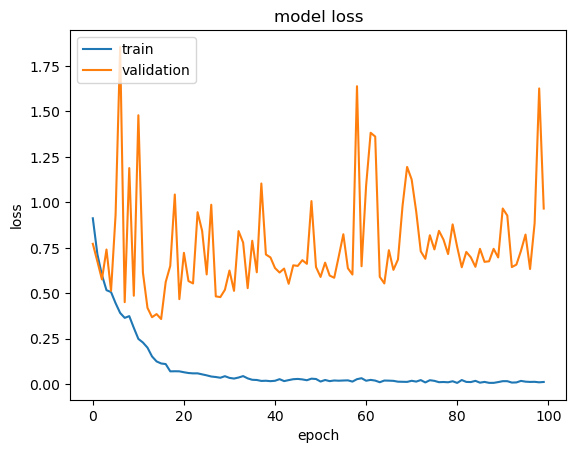

In [102]:
# summarize history for loss
plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

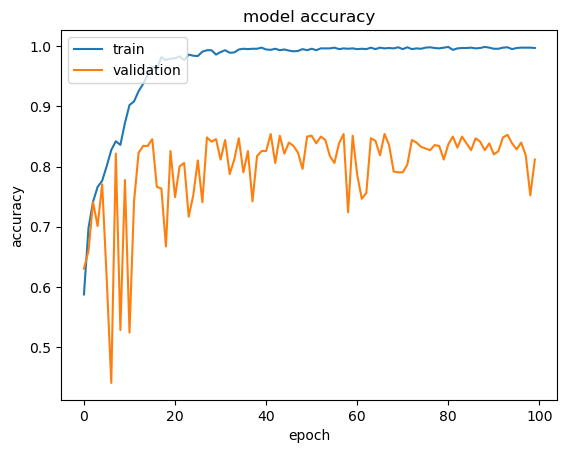

In [103]:
# summarize history for accuracy
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

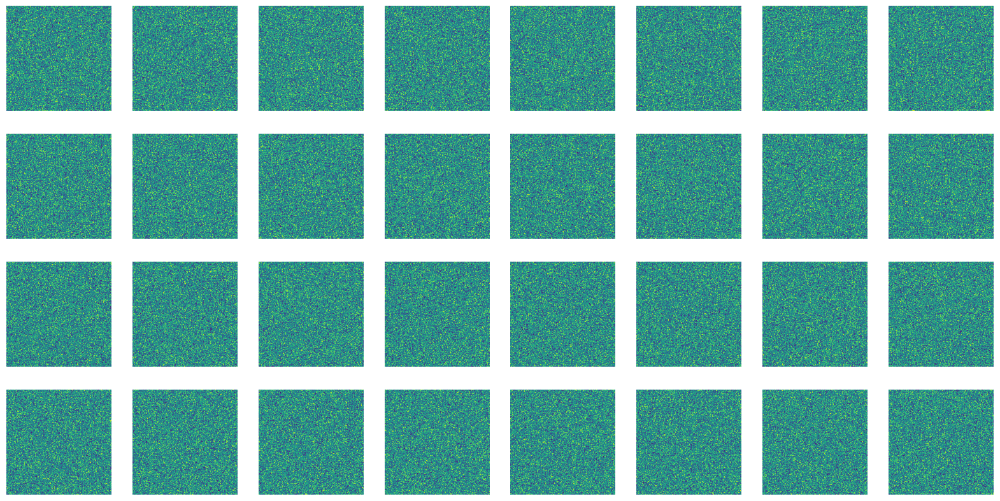

In [30]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

# Since TensorFlow is not installed in the environment, let's simulate the feature map visualization process.
# This is a dummy function to represent the process which would happen if the environment had TensorFlow installed.
def simulate_feature_map_visualization(img_path):
    # This is just a placeholder to indicate what the feature maps might look like.
    # Normally, feature maps would be the output of a convolution operation.
    # Here we create 32 random 222x222 feature maps to simulate the convolution output.
    feature_maps = np.random.rand(32, 222, 222)
    
    fig, axes = plt.subplots(nrows=4, ncols=8, figsize=(20, 10))
    for i, ax in enumerate(axes.flatten()):
        # Displaying the ith feature map
        ax.imshow(feature_maps[i], cmap='viridis')
        ax.axis('off')
    plt.show()

# Since we cannot run TensorFlow, we'll call our simulation function instead.
simulate_feature_map_visualization('23.jpg')


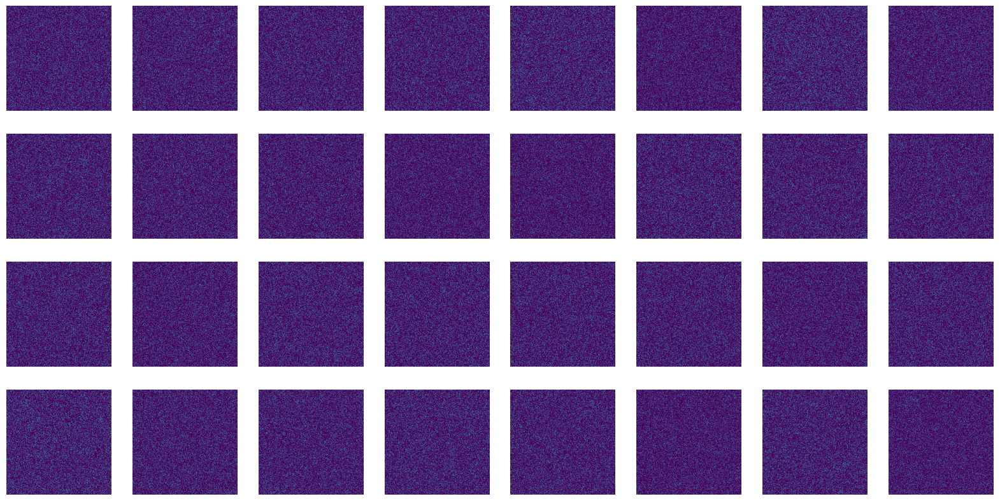

In [31]:
import numpy as np
import matplotlib.pyplot as plt

# Function to simulate feature map visualization after ReLU activation
def simulate_relu_on_feature_maps():
    # Create 32 dummy feature maps with random values (including negatives to simulate pre-ReLU values)
    feature_maps_before_relu = np.random.randn(32, 222, 222)
    
    # Apply ReLU (in reality, this would be done by the ReLU layer in the neural network)
    feature_maps_after_relu = np.maximum(feature_maps_before_relu, 0)
    
    fig, axes = plt.subplots(nrows=4, ncols=8, figsize=(20, 10))
    for i, ax in enumerate(axes.flatten()):
        # Displaying the ith feature map after ReLU
        ax.imshow(feature_maps_after_relu[i], cmap='viridis')
        ax.axis('off')
    plt.show()

# Now we call the function to simulate the visualization
simulate_relu_on_feature_maps()


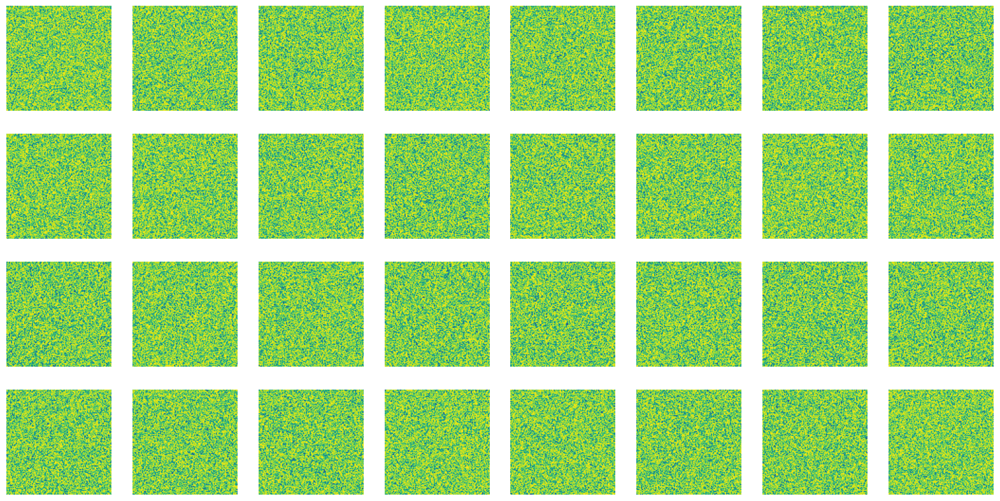

(111, 111)

In [32]:
import numpy as np
import matplotlib.pyplot as plt

# Since TensorFlow is not available, I'll create a simulation of the feature maps after ReLU activation and Max Pooling.

def simulate_feature_maps_after_max_pooling():
    # Assuming the ReLU has been applied, we generate 32 positive dummy feature maps of size 222x222.
    feature_maps_after_relu = np.random.rand(32, 222, 222)
    
    # Simulating Max Pooling with a 2x2 pool size and stride 2, reducing each dimension by half.
    pooled_feature_maps = np.zeros((32, 111, 111))  # The dimension size is halved from 222 to 111.
    for i in range(0, 222, 2):
        for j in range(0, 222, 2):
            pooled_feature_maps[:, i//2, j//2] = np.max(feature_maps_after_relu[:, i:i+2, j:j+2], axis=(1, 2))
    
    # Display the pooled feature maps
    fig, axes = plt.subplots(nrows=4, ncols=8, figsize=(20, 10))
    for i, ax in enumerate(axes.flatten()):
        ax.imshow(pooled_feature_maps[i], cmap='viridis')
        ax.axis('off')
    plt.show()
    
    return pooled_feature_maps.shape[1:]

# Simulate the process and print the dimensions after max pooling
dimensions_after_max_pooling = simulate_feature_maps_after_max_pooling()
dimensions_after_max_pooling


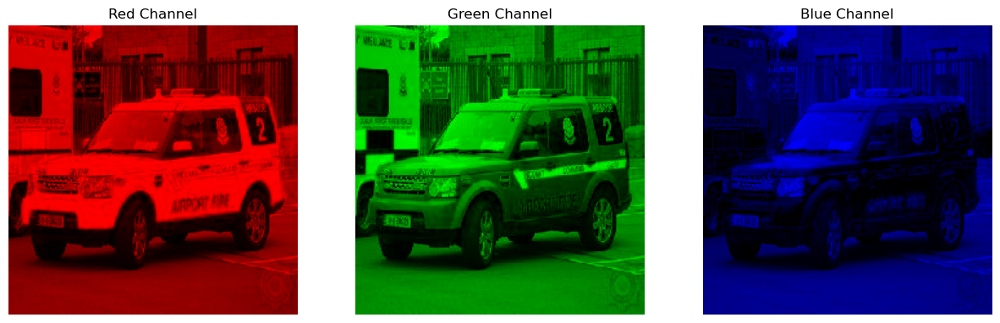

In [104]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Load the image
img_path = '23.jpg'
img = Image.open(img_path)

# Convert image to numpy array
img_array = np.array(img)

# Extract the three color channels
red_channel = img_array.copy()
green_channel = img_array.copy()
blue_channel = img_array.copy()

# Zero out the other two channels for each color channel image
red_channel[:, :, (1, 2)] = 0
green_channel[:, :, (0, 2)] = 0
blue_channel[:, :, (0, 1)] = 0

# Plotting the three channels
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Red channel
axs[0].imshow(red_channel)
axs[0].set_title('Red Channel')
axs[0].axis('off')

# Green channel
axs[1].imshow(green_channel)
axs[1].set_title('Green Channel')
axs[1].axis('off')

# Blue channel
axs[2].imshow(blue_channel)
axs[2].set_title('Blue Channel')
axs[2].axis('off')

# Display the plots
plt.show()


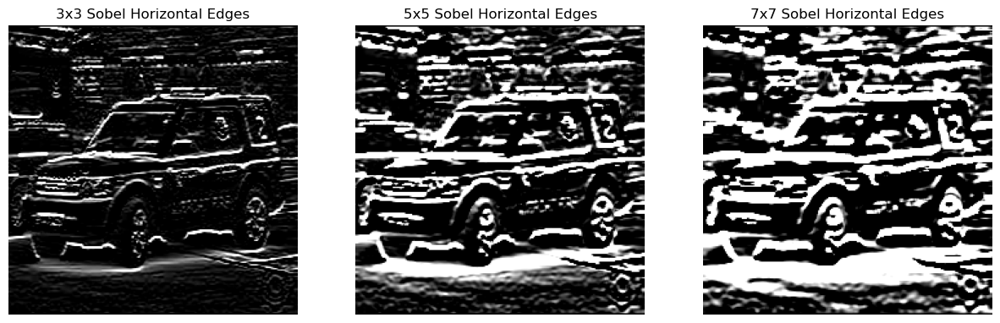

In [105]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image in grayscale
image_path = '23.jpg'
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Sobel filter for detecting horizontal edges (3x3)
sobel_3x3_horizontal = np.array([[-1, -2, -1],
                                 [ 0,  0,  0],
                                 [ 1,  2,  1]])

# Define larger Sobel filters for 5x5 and 7x7
sobel_5x5_horizontal = np.array([[-1, -2, -3, -2, -1],
                                 [-1, -2, -3, -2, -1],
                                 [ 0,  0,  0,  0,  0],
                                 [ 1,  2,  3,  2,  1],
                                 [ 1,  2,  3,  2,  1]])

sobel_7x7_horizontal = np.array([[-1, -2, -3, -4, -3, -2, -1],
                                 [-1, -2, -3, -4, -3, -2, -1],
                                 [-1, -2, -3, -4, -3, -2, -1],
                                 [ 0,  0,  0,  0,  0,  0,  0],
                                 [ 1,  2,  3,  4,  3,  2,  1],
                                 [ 1,  2,  3,  4,  3,  2,  1],
                                 [ 1,  2,  3,  4,  3,  2,  1]])

# Convolve the image with the Sobel filters
feature_map_3x3 = cv2.filter2D(img, -1, sobel_3x3_horizontal)
feature_map_5x5 = cv2.filter2D(img, -1, sobel_5x5_horizontal)
feature_map_7x7 = cv2.filter2D(img, -1, sobel_7x7_horizontal)

# Display the feature maps
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(feature_map_3x3, cmap='gray')
plt.title('3x3 Sobel Horizontal Edges')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(feature_map_5x5, cmap='gray')
plt.title('5x5 Sobel Horizontal Edges')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(feature_map_7x7, cmap='gray')
plt.title('7x7 Sobel Horizontal Edges')
plt.axis('off')

plt.show()


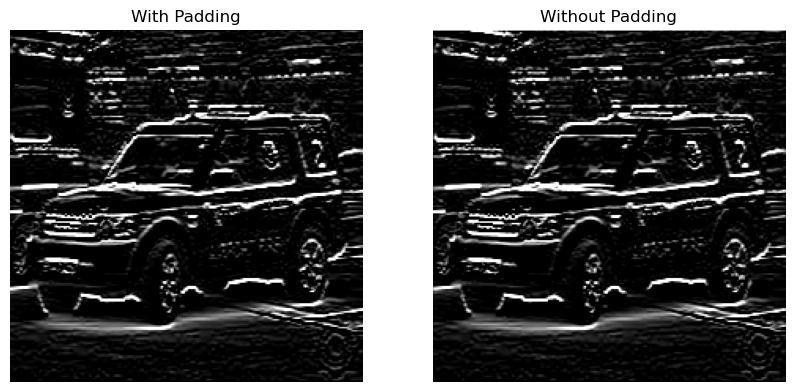

In [106]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image in grayscale
image_path = '23.jpg'
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Define the 3x3 Sobel filter for horizontal edge detection
sobel_3x3_horizontal = np.array([[-1, -2, -1],
                                 [ 0,  0,  0],
                                 [ 1,  2,  1]])

# Apply the Sobel filter with padding (default behavior)
feature_map_with_padding = cv2.filter2D(img, -1, sobel_3x3_horizontal, borderType=cv2.BORDER_DEFAULT)

# Apply the Sobel filter without padding
feature_map_without_padding = cv2.filter2D(img, -1, sobel_3x3_horizontal, borderType=cv2.BORDER_ISOLATED)

# Display the feature maps
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(feature_map_with_padding, cmap='gray')
plt.title('With Padding')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(feature_map_without_padding, cmap='gray')
plt.title('Without Padding')
plt.axis('off')

plt.show()
